DETECTS NUMBER PLATE + OCR + STATE RECOGNITION

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.8/914.8 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 60.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import ultralytics
from ultralytics import YOLO
import cv2
from PIL import Image
from IPython.display import Video
import matplotlib.pyplot as plt
from IPython.display import display
import torch
ultralytics.checks()

Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.0/112.6 GB disk)


In [ ]:
!pip install torch torchvision numpy opencv-python ultralytics pytesseract



0: 640x1728 1 License_plate, 68.3ms
Speed: 31.7ms preprocess, 68.3ms inference, 427.4ms postprocess per image at shape (1, 3, 640, 1728)


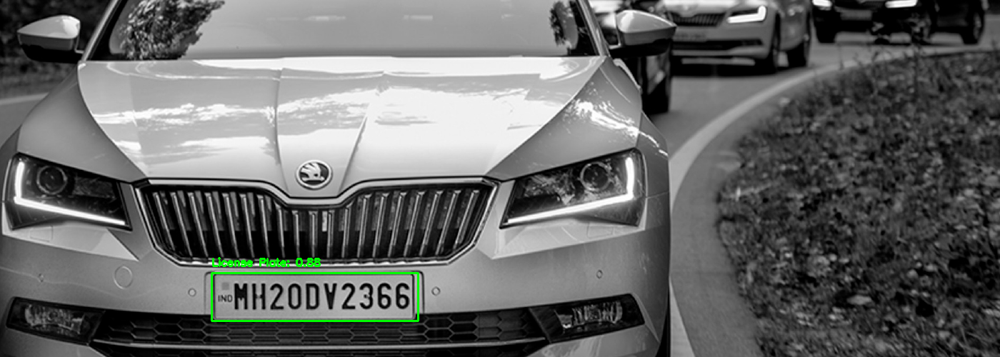

Output image saved as: output_detection.jpg


In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def detect_license_plates(model_path, image_path):
    """
    Detect license plates in an image using YOLOv8 model

    Args:
        model_path (str): Path to the trained YOLOv8 model (.pt file)
        image_path (str): Path to the image for detection
    """
    # Load the YOLOv8 model
    model = YOLO(model_path)

    # Read the image
    image = cv2.imread(image_path)

    # Perform detection
    results = model(image)[0]

    # Create a copy of the image for drawing
    output_image = image.copy()

    # Process and draw results
    for result in results.boxes.data.tolist():
        x1, y1, x2, y2, score, class_id = result

        # Convert coordinates to integers
        x1 = int(x1)
        y1 = int(y1)
        x2 = int(x2)
        y2 = int(y2)

        # Draw bounding box
        cv2.rectangle(output_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Add confidence score
        conf_text = f'License Plate: {score:.2f}'
        cv2.putText(output_image, conf_text, (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the image using cv2_imshow
    cv2_imshow(output_image)

    # Optionally save the output image
    output_path = 'output_detection.jpg'
    cv2.imwrite(output_path, output_image)
    print(f"Output image saved as: {output_path}")

# Example usage
model_path = '/content/best.pt'  # Path to your trained model
image_path = '/content/Skoda-Superb-BW-India_car.jpg'  # Path to your test image
detect_license_plates(model_path, image_path)

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 18 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (5,799 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 124926 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

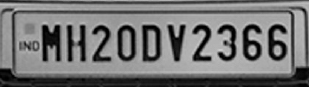

Preprocessed plate region:


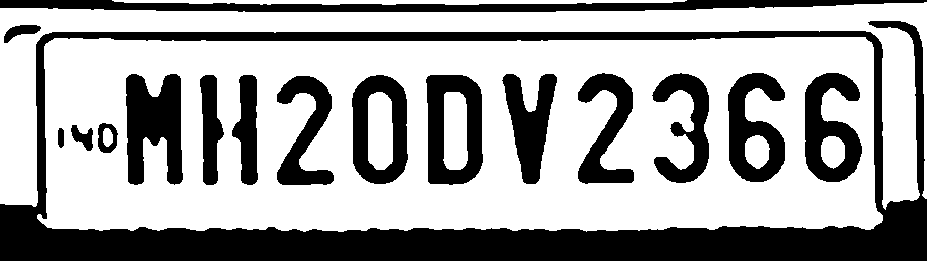


Trying different OCR configurations:
PSM 6 result: MH20DV2366
PSM 7 result: MH20DV2366
PSM 8 result: JMH200V2366

Final detected text for plate 1: MH20DV2366

Final image with detections:


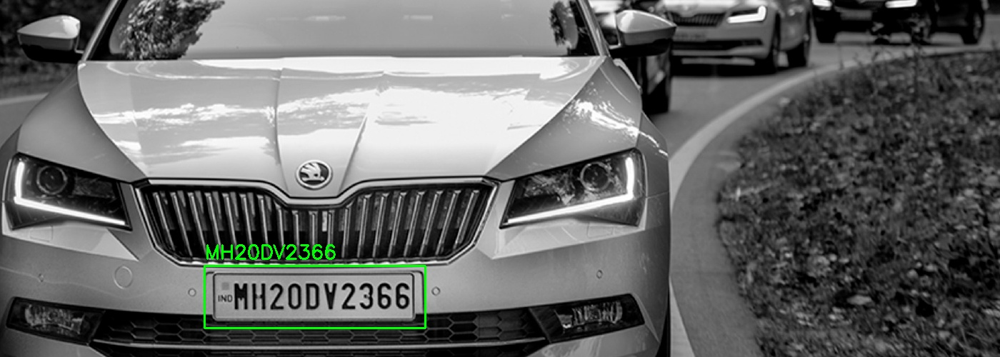

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import pytesseract
from google.colab.patches import cv2_imshow

def enhance_plate_image(plate_img):
    """
    Enhanced preprocessing pipeline for better OCR accuracy
    """
    # Convert to grayscale
    gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)

    # Resize image to a larger size
    scale_factor = 3  # Increased scale factor
    enlarged = cv2.resize(gray, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_CUBIC)

    # Apply bilateral filter to remove noise while preserving edges
    denoised = cv2.bilateralFilter(enlarged, 11, 17, 17)

    # Apply Otsu's thresholding
    _, thresh = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return thresh

def extract_plate_text(model_path, image_path):
    """
    Extract license plate text from image with debugging
    """
    print("Loading model and image...")
    model = YOLO(model_path)
    image = cv2.imread(image_path)

    print("\nPerforming detection...")
    results = model(image)[0]
    print(f"Found {len(results.boxes.data)} potential license plates")

    # Process each detection
    for idx, result in enumerate(results.boxes.data.tolist()):
        print(f"\nProcessing detection {idx + 1}:")
        x1, y1, x2, y2, score, class_id = result

        # Convert coordinates to integers
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

        # Extract the license plate region with padding
        padding = 10
        x1 = max(0, x1 - padding)
        y1 = max(0, y1 - padding)
        x2 = min(image.shape[1], x2 + padding)
        y2 = min(image.shape[0], y2 + padding)

        plate_region = image[y1:y2, x1:x2]
        print(f"Extracted region size: {plate_region.shape}")

        # Show the extracted region
        print("Original plate region:")
        cv2_imshow(plate_region)

        # Preprocess the plate image
        print("Preprocessed plate region:")
        processed_plate = enhance_plate_image(plate_region)
        cv2_imshow(processed_plate)

        # Try multiple PSM modes for better accuracy
        psm_modes = [6, 7, 8]
        texts = []

        print("\nTrying different OCR configurations:")
        for psm in psm_modes:
            config = f'--oem 3 --psm {psm} -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
            text = pytesseract.image_to_string(processed_plate, config=config).strip()
            cleaned_text = ''.join(c for c in text if c.isalnum()).upper()
            if cleaned_text:
                texts.append(cleaned_text)
                print(f"PSM {psm} result: {cleaned_text}")

        # Get the most common result
        if texts:
            final_text = max(set(texts), key=texts.count)
            print(f"\nFinal detected text for plate {idx + 1}: {final_text}")

            # Draw on image
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, final_text, (x1, y1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
        else:
            print(f"\nNo text detected for plate {idx + 1}")

    print("\nFinal image with detections:")
    cv2_imshow(image)

# Make sure Tesseract is installed
!apt-get install tesseract-ocr -y

# Example usage
print("Starting license plate detection and OCR...")
model_path = '/content/best.pt'  # Adjust path as needed
image_path = '/content/Skoda-Superb-BW-India_car.jpg'  # Adjust path as needed
extract_plate_text(model_path, image_path)

car0=bad
car1=vgood
car5=vgood
car3=
car4=half number plate detection


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.
Starting license plate detection and OCR...
Loading model and image...

Performing detection...

0: 992x1728 1 License_plate, 21.3ms
Speed: 15.9ms preprocess, 21.3ms inference, 1.3ms postprocess per image at shape (1, 3, 992, 1728)
Found 1 potential license plates

Processing detection 1:
Extracted region size: (212, 942, 3)
Original plate region:


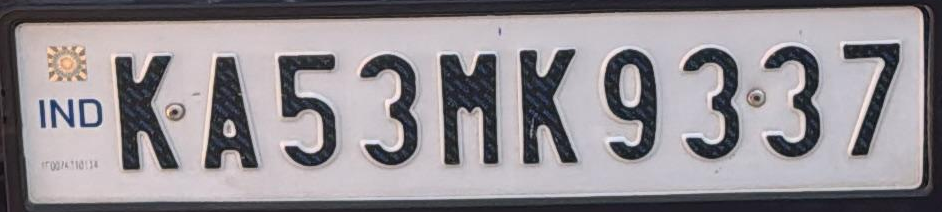

Preprocessed plate region:


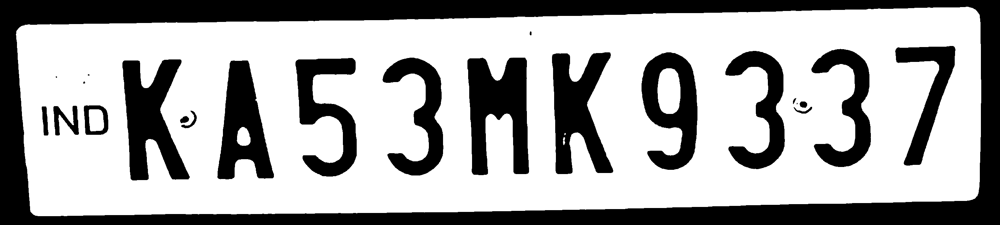


Trying different OCR configurations:
PSM 6 result: KA53MK9337
PSM 7 result: KA53MK9337
PSM 8 result: KAS3NK9337

Final detected text for plate 1: KA53MK9337
{'KA53MK9337'}

Final image with detections:


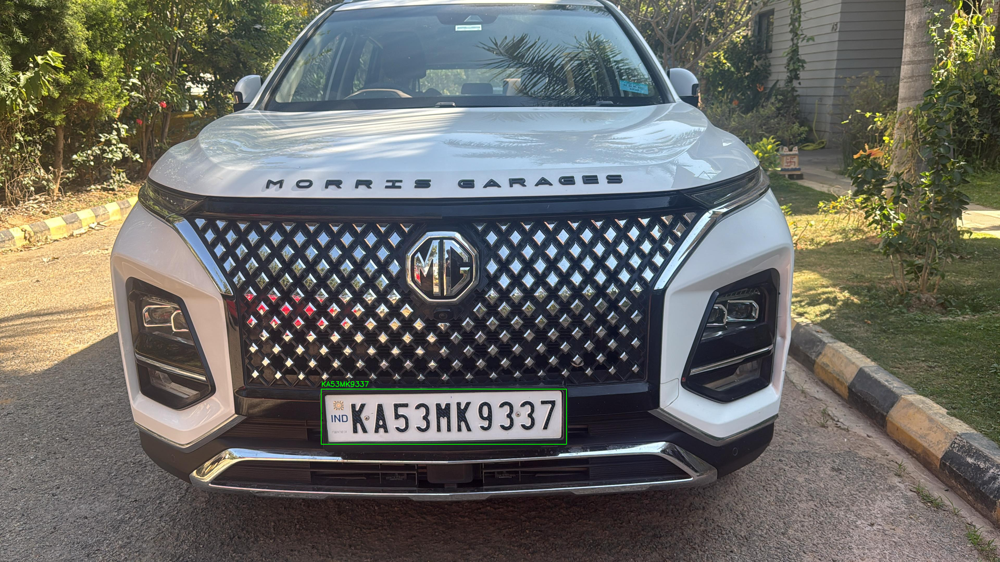

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import pytesseract
from google.colab.patches import cv2_imshow

def enhance_plate_image(plate_img):
    """
    Enhanced preprocessing pipeline for better OCR accuracy
    """
    # Convert to grayscale
    gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)

    # Resize image to a larger size
    scale_factor = 3  # Increased scale factor
    enlarged = cv2.resize(gray, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_CUBIC)

    # Apply bilateral filter to remove noise while preserving edges
    denoised = cv2.bilateralFilter(enlarged, 11, 17, 17)

    # Apply Otsu's thresholding
    _, thresh = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return thresh

def extract_plate_text(model_path, image_path):
    """
    Extract license plate text from image with debugging
    """
    print("Loading model and image...")
    model = YOLO(model_path)
    image = cv2.imread(image_path)

    print("\nPerforming detection...")
    results = model(image)[0]
    print(f"Found {len(results.boxes.data)} potential license plates")

    # Process each detection
    for idx, result in enumerate(results.boxes.data.tolist()):
        print(f"\nProcessing detection {idx + 1}:")
        x1, y1, x2, y2, score, class_id = result

        # Convert coordinates to integers
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

        # Extract the license plate region with padding
        padding = 10
        x1 = max(0, x1 - padding)
        y1 = max(0, y1 - padding)
        x2 = min(image.shape[1], x2 + padding)
        y2 = min(image.shape[0], y2 + padding)

        plate_region = image[y1:y2, x1:x2]
        print(f"Extracted region size: {plate_region.shape}")

        # Show the extracted region
        print("Original plate region:")
        cv2_imshow(plate_region)

        # Preprocess the plate image
        print("Preprocessed plate region:")
        processed_plate = enhance_plate_image(plate_region)
        cv2_imshow(processed_plate)

        # Try multiple PSM modes for better accuracy
        psm_modes = [6, 7, 8]
        texts = []

        print("\nTrying different OCR configurations:")
        for psm in psm_modes:
            config = f'--oem 3 --psm {psm} -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
            text = pytesseract.image_to_string(processed_plate, config=config).strip()
            cleaned_text = ''.join(c for c in text if c.isalnum()).upper()
            if cleaned_text:
                texts.append(cleaned_text)
                print(f"PSM {psm} result: {cleaned_text}")

        # Get the most common result
        if texts:
            final_text = max(set(texts), key=texts.count)
            print(f"\nFinal detected text for plate {idx + 1}: {final_text}")
            carprint= {final_text}
            print(carprint)

            # Draw on image
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, final_text, (x1, y1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
        else:
            print(f"\nNo text detected for plate {idx + 1}")

    print("\nFinal image with detections:")
    cv2_imshow(image)

# Make sure Tesseract is installed
!apt-get install tesseract-ocr -y

# Example usage
print("Starting license plate detection and OCR...")
model_path = '/content/best.pt'  # Adjust path as needed
image_path = '/content/car7.jpg'  # Adjust path as needed
extract_plate_text(model_path, image_path)

In [ ]:
print(carprint)

AS99LP9779


In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your CSV file


Saving updated_vehicle_database.csv to updated_vehicle_database (1).csv


In [ ]:
import pandas as pd

# Load your CSV file
df = pd.read_csv('/content/updated_vehicle_database.csv')  # Change to your actual CSV filename

# Display the first few rows of the data to understand the structure
print(df.head())


         Make     Model  Color License_Plate
0      Maruti     Swift   Grey    AS99LP9779
1  Volkswagen      Polo  White    CD42DO8815
2    Mahindra   Scorpio   Blue    OD38OO9407
3        Tata     Nexon   Grey    HR54DC2261
4      Toyota  Fortuner    Red    CG44AA1533


In [ ]:
extracted_plate = "KA01AB1234"

# Query the DataFrame to check if the license plate exists
plate_found = df[df['License_Plate'] == extracted_plate]

if not plate_found.empty:
    print(f"License Plate {extracted_plate} found in the database!")
else:
    print(f"License Plate {extracted_plate} NOT found in the database!")


License Plate KA01AB1234 NOT found in the database!


In [ ]:
# License plate stored in variable carprint
carprint = "AS99LP9779"

# Extract the first two characters
state_code = carprint[:2]

# Dictionary mapping state codes to state names
state_dict = {
    'AN': 'Andaman and Nicobar Islands',
    'AP': 'Andhra Pradesh',
    'AR': 'Arunachal Pradesh',
    'AS': 'Assam',
    'BR': 'Bihar',
    'CH': 'Chandigarh',
    'CT': 'Chhattisgarh',
    'DL': 'Delhi',
    'DN': 'Dadra and Nagar Haveli and Daman and Diu',
    'GA': 'Goa',
    'GJ': 'Gujarat',
    'HR': 'Haryana',
    'HP': 'Himachal Pradesh',
    'JK': 'Jammu and Kashmir',
    'JH': 'Jharkhand',
    'KA': 'Karnataka',
    'KL': 'Kerala',
    'LA': 'Ladakh',
    'LD': 'Lakshadweep',
    'MP': 'Madhya Pradesh',
    'MH': 'Maharashtra',
    'MN': 'Manipur',
    'ML': 'Meghalaya',
    'MZ': 'Mizoram',
    'NL': 'Nagaland',
    'OD': 'Odisha',
    'PY': 'Puducherry',
    'PB': 'Punjab',
    'RJ': 'Rajasthan',
    'SK': 'Sikkim',
    'TN': 'Tamil Nadu',
    'TS': 'Telangana',
    'UP': 'Uttar Pradesh',
    'UK': 'Uttarakhand',
    'WB': 'West Bengal',
    '21': 'Bharat Series',
    '22': 'Bharat Series',
    '23': 'Bharat Series',
    '24': 'Bharat Series',
}

# Check if the state code exists in the dictionary
if state_code in state_dict:
    print(f"The license plate {carprint} belongs to {state_dict[state_code]}")
else:
    print(f"The state code {state_code} is not recognized.")


The license plate AS99LP9779 belongs to Assam
